# Table of Contents:
1. [Library Imports](#li)
2. [Data](#d)
3. [Initial Preprocessing](#ip)
4. [Inconsistencies](#inconsistencies)
5. [Data Visualization](#dataviz)
6. [Column Exclusion](#column-exclusion)
7. [Imputation](#imputation)
8. [Outliers](#outliers)
9. [Feature Engineering](#feature-engineering)
10. [Data Visualization](#dataviz2)



# Library Imports
<a id='li'></a>

In [625]:
### BASIC LIBRARIES
# !pip install numpy
import numpy as np
# !pip install pandas
import pandas as pd

### VISUALIZATION
# !pip install matplotlib
import matplotlib.pyplot as plt
# !pip install seaborn
import seaborn as sns
# !pip install plotly
# import plotly.express as px
# !pip install squarify
# import squarify
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
# !pip install nbformat>=4.2.0

### SKLEARN
# !pip install scikit-learn
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

### WARNINGS
import warnings
warnings.filterwarnings('ignore')

### FUNCTIONS
from utils1 import *

### AUTORELOAD
%load_ext autoreload
%autoreload 2


# Set the path to the data files
# path = "C:\\Users\\ritaf\\Documentos\\Estudos\\NovaIMS\\Mestrado_GIBI\\DM_I\\DM_Project\\"


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Open Data
<a id='data'></a>

In [626]:
data = pd.read_csv('Data\project_data.csv')

In [627]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123683 entries, 0 to 123682
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ID_Client               123354 non-null  object 
 1   Frequency_items         123683 non-null  int64  
 2   Potencial_Score         123683 non-null  float64
 3   ZIP_Code                123089 non-null  object 
 4   Longevity_months        123683 non-null  int64  
 5   Latitude                123683 non-null  float64
 6   Longitude               123683 non-null  float64
 7   Credit_factor           123683 non-null  float64
 8   Relevance_criteria      123683 non-null  object 
 9   Store_state             123683 non-null  object 
 10  Recency_in_weeks        123683 non-null  int64  
 11  Returns                 123683 non-null  int64  
 12  ID_Store_last           123683 non-null  int64  
 13  Gender                  42566 non-null   object 
 14  Flaged              

In [628]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Frequency_items,123683.0,38.261224,13.594001,1.0,29.000000,37.00000,47.000000,131.000000
Potencial_Score,123683.0,30.392316,99.673585,-1.0,0.800000,24.05884,39.701604,11481.040829
Longevity_months,123683.0,13.665354,9.881178,-12.0,6.000000,13.00000,21.000000,45.000000
Latitude,123683.0,25.249363,29.997630,-5.0,-0.166667,1.00000,60.126211,72.170287
Longitude,123683.0,6.158188,7.697199,-5.0,-0.166667,1.00000,13.971501,30.973885
Credit_factor,123683.0,0.899913,0.799920,0.0,0.700000,0.70000,1.000000,28.400000
Recency_in_weeks,123683.0,11.244706,3.799946,-4.0,9.000000,11.00000,14.000000,18.000000
Returns,123683.0,4.310972,27.629597,-87.0,0.000000,0.00000,0.000000,591.000000
ID_Store_last,123683.0,1.000000,0.000000,1.0,1.000000,1.00000,1.000000,1.000000
Flaged,123683.0,0.010373,0.101639,0.0,0.000000,0.00000,0.000000,2.000000


# Refactoring
<a id='preproc'></a>

Put all words in the column's names in lower case for better cohesion.

In [629]:
data.columns = [col.lower() for col in data.columns]

# Initial Preprocessing
<a id='preproc'></a>

| Column | NaN | Ws/Unkwn | Outliers | Negs | Ambiguous | Dups | Wrong Type | Notes |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| id_client | x | x |  |  |  | x |  |  |
| frequency_items |  |  |  |  |  |  |  |  |
| potencial_score |  |  | x | x |  |  |  | Round |
| zip_code | x | x |  |  |  |  | x | Obj -> int |
| longevity_months |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| latitude & longitude |  |  |  |  |  |  |  | Block in Africa |
| credit_factor |  |  | x |  |  |  |  | Different interpretation |
| relevance_criteria |  | x |  |  |  |  |  | Might convert to boolean |
| recency_in_weeks |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| returns |  |  | x | x | |  |  |  |
| gender | x |  |  |  | x |  |  | Drop -> too many outliers |
| flaged |  |  |  |  | x |  | x | Is a bool but has 2s |
| promotional_percentage |  |  | x | x |  |  |  |  |
| education | x | x |  |  | x |  |  | Drop -> too many outliers |
| beer |  |  | x |  |  |  |  |  |
| bottled_water |  |  | x |  |  |  |  |  |
| dairy |  |  | x |  |  |  | x | Obj -> int |
| fresh_foods |  |  | x | x |  |  |  |  |
| frozen_foods | x |  | x | x |  |  |  |  |
| fruit_beverages |  |  | x | x |  |  |  |  |
| pastry |  |  | x |  |  |  |  |  |
| sodas |  |  | x | x |  |  |  |  |
| toiletries |  |  | x | x |  |  |  |  |
| veggies |  |  | x | x |  |  |  |  |
| wines |  |  | x | x |  |  |  |  |
| id_store_last |  |  |  |  |  |  |  | Constant |
| checked_ok |  |  |  |  |  |  |  | Constant |
| store_state |  |  |  |  |  |  |  | Constant |

### Constant Columns

In [630]:
# Droping constant columns
data.drop(columns=['id_store_last', 'checked_ok', 'store_state'], inplace=True)

### Set Missing Values

In [631]:
# Setting up missing values as NaN
data['id_client'].replace(' ', np.nan, inplace=True)
data['zip_code'].replace('  ', np.nan, inplace=True) # 1% of NaN
data['gender'].replace({'    ': np.nan, 'm': np.nan, 'mm': np.nan, 'j': np.nan}, inplace=True) # 73% of NaN
data['education'].replace(' ', np.nan, inplace=True) # 42% of NaN

### Correct Values

In [632]:
# Correcting ambiguity
data['gender'].replace({'Female': 'female'}, inplace=True)
data['education'].replace({'High School ': 'High School', 'Bachelor Degree': 'BSc Degree'}, inplace=True)

### DataType Correction

In [633]:
# Categorical to numerical
data['zip_code'] = data['zip_code'].astype(float)

dairy_values = data['dairy'].str.split(',', expand=True)
dairy_values[1] = dairy_values[1].astype(float)
if (dairy_values[1] != 0).any():
    data['dairy'] = data['dairy'].str.replace(',', '.').astype(float)
else:
    data['dairy'] = data['dairy'].str.replace(',000', '').astype(int)

# Float to Integer
if ((data['toiletries'] % 1 == 0).all()):
    data['toiletries'] = data['toiletries'].astype(int)

### Other Transformations

In [634]:
data['potencial_score'] = data['potencial_score'].round(2)

# Inconsistencies
<a id='inconsistencies'></a>

### Flagged

In [635]:
data['flaged'].replace(2, np.nan, inplace=True) # ~0% of NaN

### Returns & Spent Amounts

In [636]:
spent_amounts = ['beer', 'bottled_water', 'bread', 'meat', 'dairy', 'fresh_foods', 'frozen_foods', 'fruit_beverages', 'pastry', 'sodas', 'toiletries', 'veggies', 'wines']

In [637]:
# # SET INCONSISTENT VALUES OF RETURNS AS NaN

# # Identify rows where returns are 0 and there are negative values in any of the spent_amounts columns
# rows_with_neg_values = data[(data['returns'] == 0) & (data[spent_amounts] < 0).any(axis=1)]

# # Iterate over these rows and update the returns column and negative values
# for index, row in rows_with_neg_values.iterrows():
#     data.at[index, 'returns'] = np.nan

# # Check percentage of returns Missing Values
# print(f'Number of inconsistencies: {rows_with_neg_values.shape[0]}')
# print(f"Current percentage returns' null values: {round(data[data['returns'].isnull()].shape[0] / 123683 * 100, 2)}%")

### Negative Values

Spent Amounts & Promotional Percentage

In [638]:
# Create a DataFrame to store the results
negative_percentage_df = pd.DataFrame()

# Add the negative percentage data for each dataset
negative_percentage_df['%Neg Values'] = round((((data[spent_amounts] < 0).sum()) / data.shape[0]) * 100, 2)

# Transpose the DataFrame for better readability
# negative_percentage_df = negative_percentage_df.T

# Filter out columns with zero percentage
# negative_percentage_df = negative_percentage_df.loc[:, (negative_percentage_df != 0).any(axis=0)] # for transposed DataFrame
negative_percentage_df = negative_percentage_df.loc[(negative_percentage_df != 0).any(axis=1), :]

# Sort values
negative_percentage_df = negative_percentage_df.sort_values(by='%Neg Values', ascending=False)

# Display the DataFrame
negative_percentage_df

,%Neg Values
wines,13.64
veggies,12.60
sodas,11.70
toiletries,3.85
fruit_beverages,1.04
fresh_foods,0.95
frozen_foods,0.89
meat,0.06


In [639]:
# Set negative spent amounts to 0
data[spent_amounts] = data[spent_amounts].applymap(lambda x: max(x, 0))

Returns, Recency & Longevity

In [640]:
# Change the recency baseline date to 4 weeks later
data['recency_in_weeks'] = data['recency_in_weeks'] + 4

In [641]:
# SET NEGATIVE VALUES IN RETURNS AND LONGEVITY AS NaN TO BE IMPUTED LATER
inconsistent_neg_cols = ['returns', 'longevity_months'] # 2% & 8% of NaN
for col in inconsistent_neg_cols:
    data[col] = data[col].apply(lambda x: np.nan if x < 0 else x)

Spent Amounts

In [642]:
# Calculate the sum of the spent amount columns for each row
data['spent_sum'] = data[spent_amounts].sum(axis=1)

# Filter the rows where the sum is 0
rows_with_zero_spent = data[data['spent_sum'] == 0]

# Display the filtered rows
rows_with_zero_spent

,id_client,frequency_items,potencial_score,zip_code,longevity_months,latitude,longitude,credit_factor,relevance_criteria,recency_in_weeks,...,dairy,fresh_foods,frozen_foods,fruit_beverages,pastry,sodas,toiletries,veggies,wines,spent_sum
123386,10029360TON14NKID782,55,18.53,8.0,NaN,63.235627,13.384748,0.7,Priority,17,...,0,0,0.0,0,0,0,0,0,0,0.0
123387,10044657STE1NKID662,36,37.00,8.0,28.0,65.460438,15.026259,0.7,Priority,13,...,0,0,0.0,0,0,0,0,0,0,0.0
123388,10048485FEG4NKID698,50,-0.20,NaN,22.0,57.810192,16.385046,0.7,Priority,17,...,0,0,0.0,0,0,0,0,0,0,0.0
123389,100485GDENKID736,6,79.67,8.0,24.0,0.333333,0.000000,0.7,Priority,13,...,0,0,0.0,0,0,0,0,0,0,0.0
123390,10051029TON6NKID376,33,21.83,4.0,22.0,55.492309,15.403971,0.7,Priority,17,...,0,0,0.0,0,0,0,0,0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123678,9858426mGE8NKID484,33,79.60,4.0,21.0,58.698146,17.428185,0.7,Priority,19,...,0,0,0.0,0,0,0,0,0,0,0.0
123679,9869176MÓR4NKID483,37,0.30,0.0,NaN,4.000000,-0.800000,0.7,Priority,13,...,0,0,0.0,0,0,0,0,0,0,0.0
123680,992916PER8NKID237,43,79.17,8.0,11.0,60.652785,20.731272,0.7,Priority,14,...,0,0,0.0,0,0,0,0,0,0,0.0
123681,994681RNA13NKID439,75,33.31,8.0,31.0,57.199647,14.395124,0.7,Priority,21,...,0,0,0.0,0,0,0,0,0,0,0.0


In [643]:
# Calculate the mean for the original data and subset
mean_data = data.mean(numeric_only=True)
mean_subset = rows_with_zero_spent.mean(numeric_only=True)

# Combine both means into a new DataFrame
means_df = pd.DataFrame({
    'mean_data': mean_data,
    'mean_subset': mean_subset
})

# Filter only columns where the mean of the subset is not zero
means_df_non_zero_subset = means_df[means_df['mean_subset'] != 0]
means_df_non_zero_subset


,mean_data,mean_subset
frequency_items,38.261224,37.973064
potencial_score,30.392314,30.715892
zip_code,4.635253,4.836177
longevity_months,15.124561,15.559387
latitude,25.249363,27.317621
longitude,6.158188,6.875405
credit_factor,0.899913,0.851852
recency_in_weeks,15.244706,15.272727
returns,4.607680,2.510204
flaged,0.010309,0.010101


There is no significant pattern in these variables, therefore we are going to drop them.

In [644]:
# Drop the rows where the sum is 0
data = data[data['spent_sum'] != 0]
# Drop the Spent_Sum column
data.drop(columns='spent_sum', inplace=True)

### Missing Values

In [645]:
missing_percentage = round(data.isnull().mean() * 100, 2)
missing_percentage = missing_percentage[missing_percentage > 0].sort_values(ascending=False)
missing_percentage

gender              72.84
education           42.15
longevity_months     7.94
returns              1.67
zip_code             1.02
frozen_foods         0.51
id_client            0.50
dtype: float64

# Data Visualization
<a id='dataviz'></a>

### Ranges

In [646]:
numeric_columns = ['potencial_score', 'credit_factor', 'returns', 'promotional_percentage', 'beer', 'bottled_water', 
                   'bread', 'meat', 'dairy', 'fresh_foods', 'frozen_foods', 'fruit_beverages', 'pastry', 'sodas', 
                   'toiletries', 'veggies', 'wines']
categorical_columns = ['frequency_items', 'longevity_months', 'recency_in_weeks', 'education',
                       'zip_code','gender', 'relevance_criteria', 'flaged']

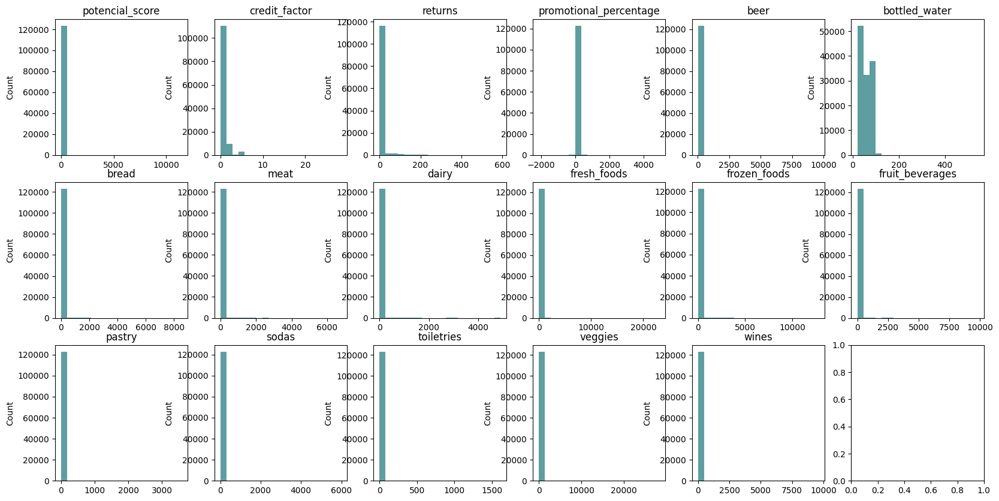

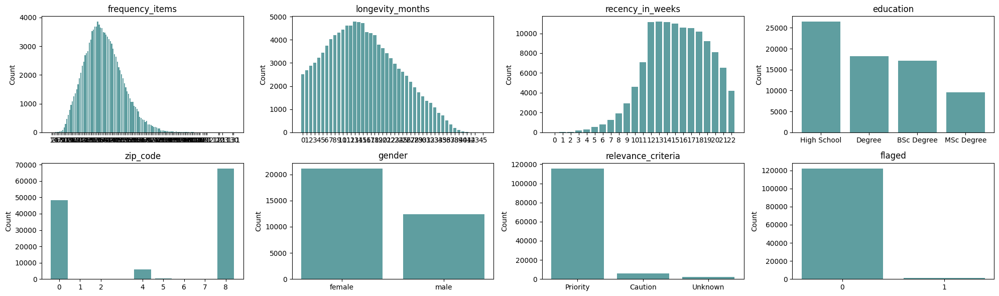

In [647]:
fig_hist, axs_hist = plt.subplots(nrows=3, ncols=6, figsize=(20, 10))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=2, ncols=4, figsize=(20, 6))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


It is clear that the numeric columns have outliers.

### Maps

In [648]:
# Sort the DataFrame by the frequency of zip_code
data['zip_code'] = pd.Categorical(data['zip_code'], categories=data['zip_code'].value_counts().index, ordered=True)
data_sorted = data.sort_values('zip_code')

print('Normal Coordinates')
plot_map(data_sorted, 'zip_code', 'id_client', 1.2)
print('Inverted Coordinates')
plot_map(data_sorted, 'zip_code', 'id_client', 1.6, invert=True)

Normal Coordinates


Inverted Coordinates


Coordinate data has a lot of generated values and Zip Code is not geographicaly representative with these coordinates, therefore we are dropping _latitude_ and _longitude_.

In [649]:
data.drop(columns=['latitude', 'longitude'], inplace=True)

# Missing Values
<a id='mv'></a>

Eliminating rows with elevated amount of missing values

In [650]:
# Calculate the proportion of missing values per row
missing_percentage_per_row = data.isnull().mean(axis=1)

# Drop rows where the missing proportion is greater than 40%
missing_data_rows = data[missing_percentage_per_row > 0.4]
data = data[missing_percentage_per_row <= 0.4]

# Print the cleaned DataFrame
print('# Rows dropped:', missing_data_rows.shape[0])

# Rows dropped: 0


Eliminating columns with an elevated amount of missing values

In [651]:
# Calculate the threshold for 40% NaNs
threshold = len(data) * 0.40

# Identify columns to drop
columns_to_drop = data.columns[data.isna().sum() > threshold]

# Drop the columns
data.drop(columns=columns_to_drop, inplace=True)

# Print the names of the dropped columns
print("Dropped columns:", columns_to_drop.tolist())

Dropped columns: ['gender', 'education']


# Outliers
<a id='o'></a>

### Spent Amounts

In [652]:
amounts_df = data[spent_amounts]

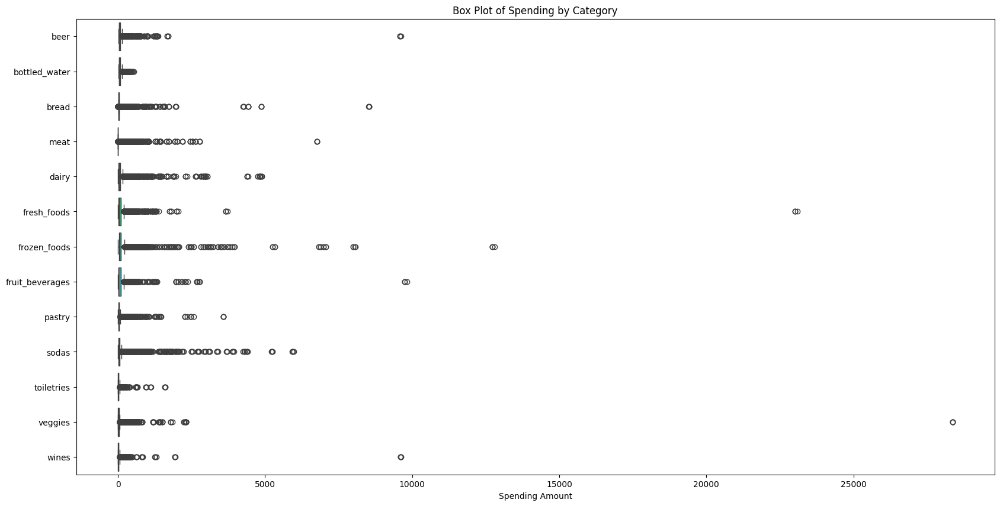

In [653]:
sns.boxplot(data=amounts_df, orient='h')

# Add labels
plt.title('Box Plot of Spending by Category')
plt.xlabel('Spending Amount')

# Show the plot
plt.show()

In [655]:
# Calculate the required statistics
stats_df = pd.DataFrame({
    'min': amounts_df.min(),
    '0.05%': amounts_df.quantile(0.0005),
    '0.1%': amounts_df.quantile(0.001),
    '<0.05%': (amounts_df < amounts_df.quantile(0.0005)).sum(),
    '<0.1%': (amounts_df < amounts_df.quantile(0.001)).sum(),
    '99.95%': amounts_df.quantile(0.9995),
    '99.9%': amounts_df.quantile(0.999),
    'max': amounts_df.max(),
    '>99.95%': (amounts_df > amounts_df.quantile(0.9995)).sum(),
    '>99.9%': (amounts_df > amounts_df.quantile(0.999)).sum()
})

stats_df


,min,0.05%,0.1%,<0.05%,<0.1%,99.95%,99.9%,max,>99.95%,>99.9%
beer,22.0,26.0,27.0,33,73,639.1525,434.000,9615.0,62,122
bottled_water,20.0,26.0,27.0,34,74,227.8450,153.000,543.0,62,120
bread,0.0,3.0,3.0,61,61,970.0000,498.000,8546.0,60,122
meat,0.0,0.0,0.0,0,0,1052.0000,704.840,6771.0,60,124
dairy,8.0,18.0,19.0,30,69,1467.7625,860.000,4885.0,62,123
fresh_foods,0.0,0.0,0.0,0,0,888.4600,560.305,23100.0,62,124
frozen_foods,0.0,0.0,0.0,0,0,2061.0610,971.000,12806.0,62,122
fruit_beverages,0.0,0.0,0.0,0,0,710.4600,524.615,9828.0,62,124
pastry,1.0,18.0,19.0,49,90,747.0000,491.225,3592.0,61,124
sodas,0.0,0.0,0.0,0,0,1953.3075,1419.605,5981.0,62,124


In [656]:
# Calculate thresholds for 95th and 99th percentiles
thresholds95 = calculate_thresholds(amounts_df, lower_quantile=0.0005, upper_quantile=0.9995)
thresholds99 = calculate_thresholds(amounts_df, lower_quantile=0.001, upper_quantile=0.999)

# Apply dynamic thresholds to filter outliers
data95, outliers95 = process_outliers(amounts_df, thresholds95)
data99, outliers99 = process_outliers(amounts_df, thresholds99)


data = data.loc[data95.index]
# data = data.loc[data99.index]

Removed 640 rows (0.5%) based on thresholds.
Removed 1257 rows (1.0%) based on thresholds.


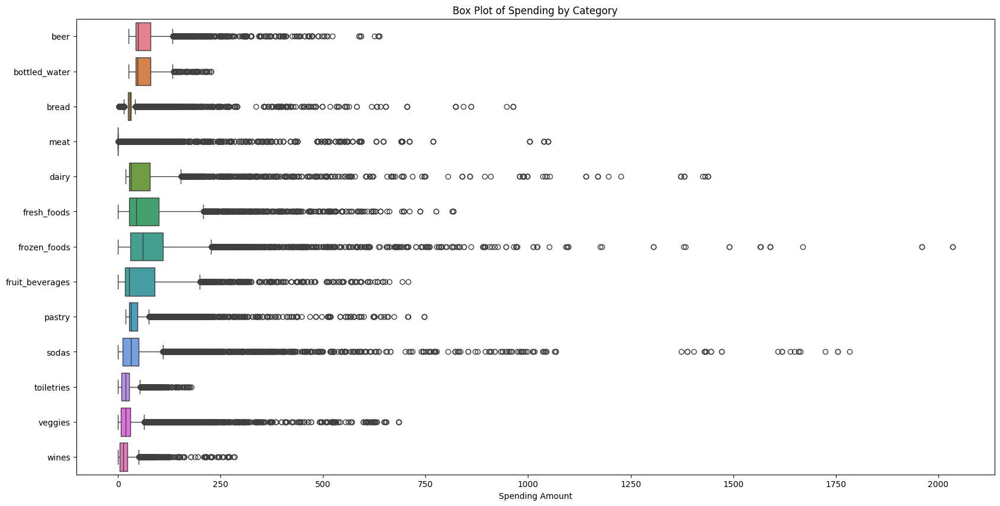

In [657]:
sns.boxplot(data=data[spent_amounts], orient='h')

# Add labels
plt.title('Box Plot of Spending by Category')
plt.xlabel('Spending Amount')

# Show the plot
plt.show()

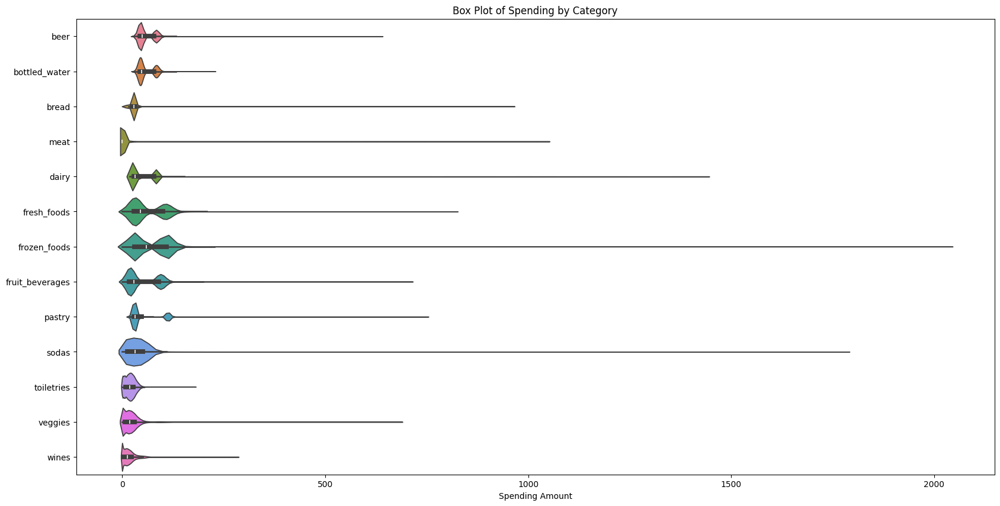

In [658]:
sns.violinplot(data=data[spent_amounts], orient='h')

# Add labels
plt.title('Box Plot of Spending by Category')
plt.xlabel('Spending Amount')

# Show the plot
plt.show()

### Potencial score & credit factor & promotional percentage

In [661]:
print(f'# out of bounds Portencial Score: {round(data[data['potencial_score'] > 100].shape[0] / data.shape[0] * 100, 2)}%')
print(f'# out of bounds Credit Factor: {round(data[data['credit_factor'] > 1].shape[0] / data.shape[0] * 100, 2)}%')
print(f'# out of bounds Promotional Percentage: {round((data[data['promotional_percentage'] > 100].shape[0] + data[data['promotional_percentage'] < 0].shape[0]) / data.shape[0] * 100, 2)}%')

# out of bounds Portencial Score: 0.67%
# out of bounds Credit Factor: 10.58%
# out of bounds Promotional Percentage: 2.31%


In [662]:
data.loc[data['potencial_score'] > 100, 'potencial_score'] = 100
data.loc[data['credit_factor'] > 1, 'credit_factor'] = 1

data.loc[data['promotional_percentage'] > 100, 'promotional_percentage'] = np.nan
data.loc[data['promotional_percentage'] < 0, 'promotional_percentage'] = np.nan

### Visualize data without outliers

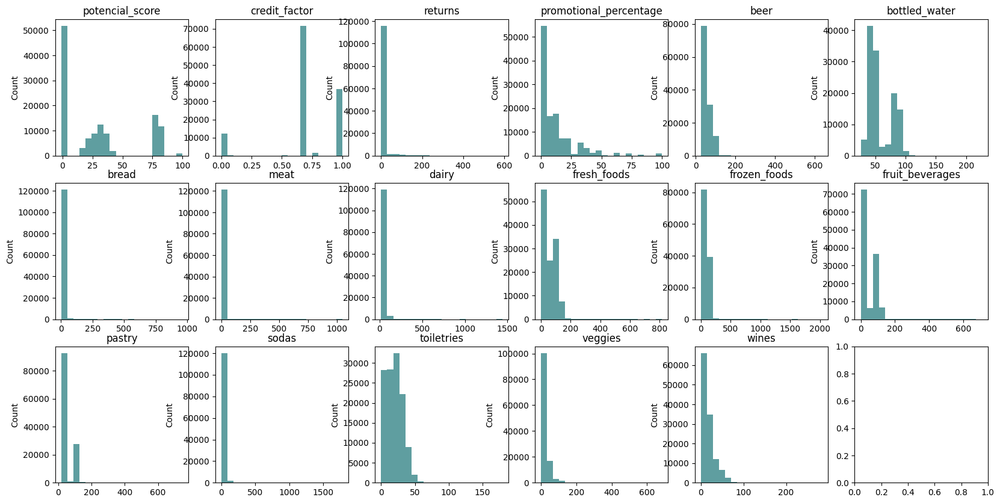

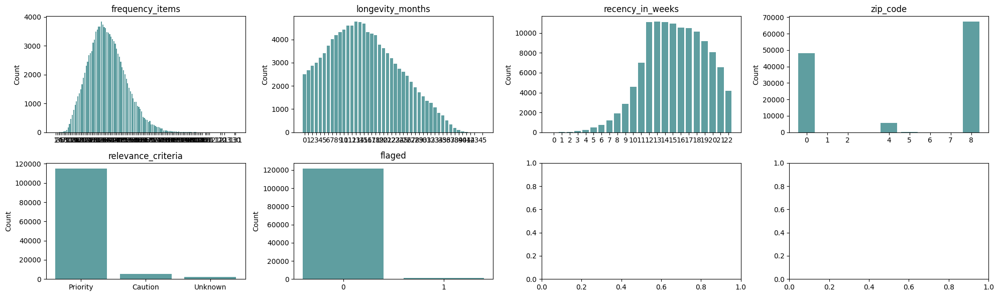

In [663]:
categorical_columns.remove('education')
categorical_columns.remove('gender')

fig_hist, axs_hist = plt.subplots(nrows=3, ncols=6, figsize=(20, 10))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=2, ncols=4, figsize=(20, 6))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()

# Imputation
<a id='imputation'></a>

In [98]:
apply_optimal_knnimputer(data.drop(columns=['id_client', 'relevance_criteria']).sample(frac=0.2, random_state=1), 2, 8)

Best Imputer: KNNImputer(n_neighbors=2)
Best Weight: uniform


In [534]:
data_imputed = knn_imputer(data, k=2, exclude_columns=['id_client', 'relevance_criteria'], weights='uniform')

In [535]:
columns_to_round = ['longevity_months', 'returns', 'zip_code', 'frozen_foods', 'flaged']

# Round the specified columns and transform them into integers
data_imputed[columns_to_round] = data_imputed[columns_to_round].round()
integer_columns = ['frequency_items', 'zip_code', 'longevity_months', 'recency_in_weeks', 'returns', 'flaged', 'promotional_percentage', 'beer', 'bottled_water', 'bread', 'meat', 'dairy', 'fresh_foods', 'frozen_foods', 'fruit_beverages', 'pastry', 'sodas', 'toiletries', 'veggies', 'wines']
data_imputed[integer_columns] = data_imputed[integer_columns].astype(int)

In [576]:
# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute4_wzipid.csv', index=False)
# data_imputed = pd.read_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute4_wzipid.csv')^

# data_imputed.to_csv('Data\project_data_cleaned_noreturnincons_impute4_wzipid_no0.csv', index=False)
# data_imputed = pd.read_csv('Data\project_data_cleaned_noreturnincons_impute4_wzipid_no0.csv')

# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute4_wzipid_no0_out.csv', index=False)
# data_imputed = pd.read_csv('Data\project_data_cleaned_noreturnincons_impute4_wzipid_no0_out.csv')

# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2_wzipid_no0_out.csv', index=False)
# data_imputed = pd.read_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2_wzipid_no0_out.csv')

# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out.csv', index=False)
data_imputed = pd.read_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out.csv')

# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out_99.csv', index=False)
# data_imputed = pd.read_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out_99.csv')

# Feature Engineering
<a id='feature-engineering'></a>

### Percentage Amouts Spent

In [577]:

# Calculate the total spend by summing the 'spend' columns across rows
total_spend = data_imputed.loc[:, spent_amounts].sum(axis = 1)

# Calculate the percentage spend for each 'spend' column
for column in spent_amounts:
    # Create a new column name for the percentage spend
    percentage_column = 'percentage_' + column
    
    # Calculate the percentage spend by dividing the 'spend' column by the total spend
    data_imputed[percentage_column] = data_imputed[column] / total_spend


In [578]:
data_imputed

,id_client,frequency_items,potencial_score,zip_code,longevity_months,credit_factor,relevance_criteria,recency_in_weeks,returns,flaged,...,percentage_meat,percentage_dairy,percentage_fresh_foods,percentage_frozen_foods,percentage_fruit_beverages,percentage_pastry,percentage_sodas,percentage_toiletries,percentage_veggies,percentage_wines
0,10156431SEG17NKID781,38,-0.40,0,23,0.7,Priority,15,0,0,...,0.075835,0.113111,0.190231,0.192802,0.134961,0.034704,0.030848,0.034704,0.012853,0.000000
1,9056576FIA11NKID679,50,-0.30,0,24,0.7,Priority,10,0,0,...,0.015625,0.200893,0.299107,0.058036,0.044643,0.069196,0.000000,0.004464,0.040179,0.004464
2,9253304IST6NKID248,48,1.60,0,32,0.7,Priority,20,0,0,...,0.000000,0.237968,0.104278,0.000000,0.066845,0.085561,0.045455,0.088235,0.069519,0.000000
3,9661067PER12NKID393,46,-0.90,0,12,1.0,Priority,14,0,0,...,0.000000,0.221945,0.064838,0.164589,0.039900,0.072319,0.077307,0.069825,0.000000,0.019950
4,9956825FEG11NKID326,31,31.61,8,10,0.7,Priority,12,0,0,...,0.000000,0.215311,0.000000,0.136364,0.064593,0.107656,0.110048,0.045455,0.055024,0.021531
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122741,9759098GRI7NKID270,51,0.10,0,25,0.7,Priority,9,6,0,...,0.037657,0.209205,0.069038,0.069038,0.081590,0.054393,0.056485,0.100418,0.112971,0.000000
122742,9513919RCO6NKID705,42,30.99,8,23,0.7,Priority,15,0,0,...,0.002294,0.229358,0.064220,0.091743,0.082569,0.061927,0.107798,0.034404,0.055046,0.006881
122743,9321321RSE7NKID776,24,79.76,8,29,0.7,Priority,13,0,0,...,0.020225,0.224719,0.137079,0.092135,0.058427,0.056180,0.060674,0.051685,0.024719,0.000000
122744,8642088SSO15NKID852,29,0.50,0,14,0.7,Priority,11,0,0,...,0.000000,0.260417,0.127604,0.054688,0.070312,0.070312,0.026042,0.010417,0.088542,0.000000


In [539]:
data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out_perc.csv', index=False)
# data_imputed.to_csv('Data\\New_Data\\project_data_cleaned_noreturnincons_impute2uni_wzipid_no0_out99_perc.csv', index=False)
